In [1]:
using Unfold
using PyMNE # MNE is a python library for EEG data analysis
using AlgebraOfGraphics # plotting Grammar of Graphics
using CSV
using DataFrames
using  StatsBase # mean/std
using FileIO # loading data
using JLD2 # loading data
using StatsModels # UnfoldFit
using CairoMakie # Plotting Backend (SVGs/PNGs)
using Printf # interpolate strings
using DataFramesMeta # @subset etc. working with DataFrames
using StatsPlots
using Pipe
using UnfoldMakie
using TopoPlots
using ColorSchemes
using TopoPlots
using GLMakie
using Query

In [2]:
begin # load  one single-subject dataset
	
	# once artifacts are working, we could ship it. But for now you have to download it and 
 #p =joinpath(pathof(UnfoldMakie),"artifacts","sub002_ses-N180_task-N180_eeg.set")
	    
	p = "../../../../store/users/ehinger/projects/unfoldjl_dev/dev/UnfoldMakie/artifact/sub-002_ses-N170_task-N170_eeg.set"
    raw = PyMNE.io.read_raw_eeglab(p,preload=false)
end;

In [3]:
begin # load unfold-fitted dataset of all subjects
	# takes ~25s to load because it is quite large :)
	p_all = "../../../../store/users/ehinger/projects/unfoldjl_dev/data/erpcore-N170.jld2"
	presaved_data = load(p_all)
	dat_e = presaved_data["data_e_all"].* 1e6
	evt_e = presaved_data["df_e_all"]
end;

In [4]:
evt_e

,latency,description,duration,event,id,category,condition,subject
,Float64,String,Float64,SubStrin…,Int64,String,String,Int64
1,1926.37,stimulus:79,0.3,stimulus,79,car,intact,1
2,2124.62,stimulus:73,0.3,stimulus,73,car,intact,1
3,2308.12,stimulus:75,0.3,stimulus,75,car,intact,1
4,2510.63,stimulus:112,0.3,stimulus,112,face,scrambled,1
5,2709.0,stimulus:17,0.3,stimulus,17,face,intact,1
6,2909.5,stimulus:32,0.3,stimulus,32,face,intact,1
7,3109.88,stimulus:169,0.3,stimulus,169,car,scrambled,1
8,3310.37,stimulus:177,0.3,stimulus,177,car,scrambled,1
9,3495.87,stimulus:174,0.3,stimulus,174,car,scrambled,1


In [8]:
begin
	# times vector (from-to)
	times = range(-0.3, length=size(dat_e,2), step=1 ./ 128)

	# get standard errors
	se_solver =(x,y)->Unfold.solver_default(x,y,stderror=true)
	# define effect-coding
	contrasts= Dict(:category => EffectsCoding(), :condition => EffectsCoding())
	
	analysis_formula = @formula 0 ~ 1 + category * condition
	
	results_allSubjects = DataFrame()
	
	for sub ∈ unique(evt_e.subject)

		# select events of one subject
	    sIx = evt_e.subject .== sub

		# fit Unfold-Model
		# declaring global so we can access the variable outside of this loop (local vs. global scope)
	    global mres = Unfold.fit(UnfoldModel, 
						analysis_formula, 
						evt_e[sIx,:], 
						dat_e[:,:,sIx], 
						times, 
						contrasts=contrasts,
						solver=se_solver);

		# make results of one subject available
		global results_onesubject = coeftable(mres);

		# concatenate results of all subjects
	    results_onesubject[!,:subject] .= sub
	    append!(results_allSubjects,results_onesubject);
	    
	end
	
end

In [727]:
results_onesubject

In [9]:
Makie.inline!(true)
CairoMakie.activate!(type="svg")

# 1. Lineplot

In [107]:
typeof(1=> "b")

Pair{Int64, String}

In [103]:
Dict(:category=>["face","car"],:condition=>["intact"])

Dict{Symbol, Vector{String}} with 2 entries:
  :condition => ["intact"]
  :category  => ["face", "car"]

In [10]:
using Unfold

res = effects(Dict(:category=>["face","car"],:condition=>["scrambled","intact"]), mres) # (design, model)
res = @subset(res, :channel .== 28)
plot_results(res);

### version 1

face
car


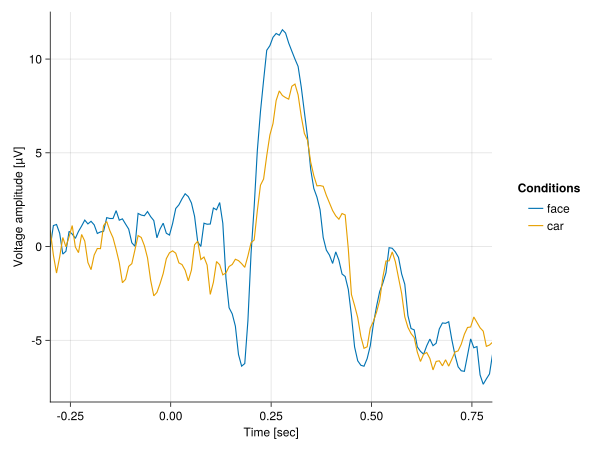

In [22]:

let 
  #=   data = @pipe results_onesubject |> 
    select(_, Not([:basisname, :group])) |>
    @subset(_, :channel .== 28) |>
    @transform(_, :channel = string.(:channel)) 
    data = filter(x -> x.coefname == "category: face" || x.coefname == "condition: scrambled" , data) =#
    
    res = effects(Dict(:category=>["face","car"], :condition=>["intact"]), mres)
    data = @pipe res |> 
        @subset(_, :channel .== 28)

    f = Figure()
    ax = f[1, 1] = Axis(f, #xticks = map(x -> round(x, digits = 2) , range(minimum(data.time), stop = maximum(data.time), length = 5)), 
        xlabel = "Time [sec]", ylabel = "Voltage amplitude [µV]")
    hidespines!(ax, :t, :r) # delete unnecessary spines (lines)
      
    j = 0
    for i in unique(data[:, :category])
        println(i)
        tmp = data[data[:, :category] .== i, :] 
        lines!(tmp.time, tmp.yhat, label = i)
        #j = j +1
        #lines!(tmp.time, tmp.estimate, label = string.(j))
    end 
    CairoMakie.xlims!(-0.3,0.8)
    f[1, 2] = Legend(f, ax, "Conditions", framevisible = false) 
    f
    #save("plots/plot1.svg", f)
end

### version 2

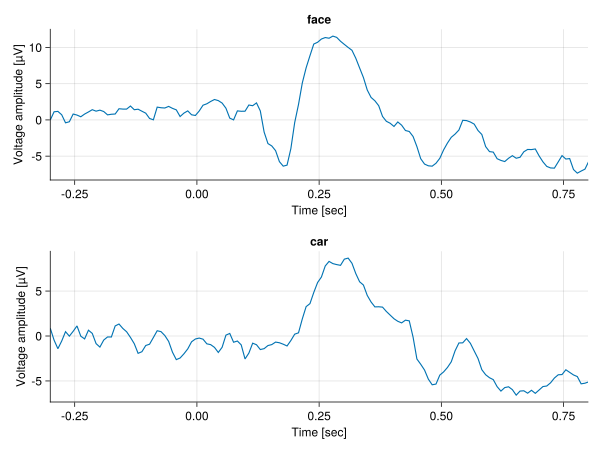

In [37]:
let 
     
    res = effects(Dict(:category=>["face","car"], :condition=>["intact"]), mres)
    data = @pipe res |> 
          @subset(_, :channel .== 28)
  
    f = Figure()
#=     ax = f[1, 1] = Axis(f, 
          xlabel = "Time [sec]", ylabel = "Voltage amplitude [µV]")
    hidespines!(ax, :t, :r) # delete unnecessary spines (lines) =#
        
    row = 0
    for i in unique(data[:, :category])
        row = row + 1
        ax = Axis(f[row, 1])
        tmp = data[data[:, :category] .== i, :] 
        lines!(tmp.time, tmp.yhat, label = i)
        CairoMakie.xlims!(-0.3,0.8)
        hidespines!(ax, :t, :r) # delete unnecessary spines (lines)
        ax.title = i
        ax.xlabel = "Time [sec]"
        ax.ylabel = "Voltage amplitude [µV]"

    end 

    
    f
    #save("plots/plot1.svg", f)
  end

- do we need an error bars here. If yes, should we take all channels?

# 2. Butterfly plot

In [313]:
data = @pipe results_onesubject |> 
        select(_, Not([:basisname, :group])) |>
        #@subset(_, :channel .< 3) |>
        #@subset(_, :coefname .== ("category: face")) #|>
        @subset(_, :coefname .== ("(Intercept)")) |>
        #@transform(_, :channel = string.(:channel)) 
        groupby(_, :channel) |> 
        transform(_, [:estimate,:time] => (x,t) -> x .- mean(x[t .< 0])) |> # baseline correction using lambda function 
        rename!(_, :estimate_time_function => :estimate_bsln_corrected) |>
        @subset(_, :estimate_bsln_corrected .== maximum(:estimate_bsln_corrected))
data

,channel,coefname,estimate,stderror,time,subject,estimate_bsln_corrected
,Int64,String,Float64,Float64,Float64,Int64,Float64
1,32,(Intercept),6030.7,8.73334,0.825,40,21.9865


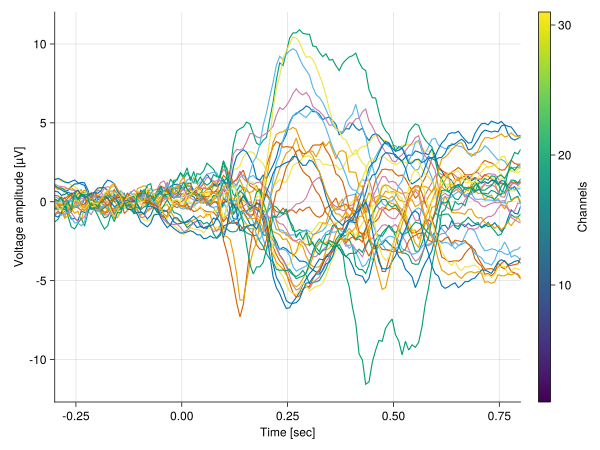

In [52]:
let 
    data = @pipe results_onesubject |> 
        select(_, Not([:basisname, :group])) |>
        @subset(_, :channel .< 32 ) |>
        @subset(_, :coefname .== ("(Intercept)")) |>
        groupby(_, :channel) |> 
        transform(_, [:estimate,:time] => (x,t) -> x .- mean(x[t .< 0])) |> # baseline correction using lambda function 
        rename!(_, :estimate_time_function => :estimate_bsln_corrected)

    f = Figure()
    ax = f[1, 1] = Axis(f,# xticks = map(x -> round(x, digits = 2) , range(minimum(data.time), stop = maximum(data.time), length = 5)), 
    xlabel = "Time [sec]", ylabel = "Voltage amplitude [µV]")
    hidespines!(ax, :t, :r) 
    CairoMakie.xlims!(-0.3,0.8)

    #data  
 
    for i in unique(data[:, :channel])
        tmp = data[data[:, :channel] .== i, :] 
        lines!(tmp.time, tmp.estimate_bsln_corrected)
    end 

    Colorbar(f[1, 2] , limits = (1, length(unique(data[:, :channel]))), label = "Channels")
    f
    #save("plots/plot2.svg", f)
end

# 3. Single topoplot

In [184]:
begin
	mon = PyMNE.channels.make_standard_montage("standard_1020")
	raw.set_channel_types(Dict("HEOG_left"=>"eog","HEOG_right"=>"eog","VEOG_lower"=>"eog"))
	raw.set_montage(mon,match_case=false)
	pos = PyMNE.channels.make_eeg_layout(get_info(raw)).pos
	pos = [Point2f(pos[k,1],pos[k,2]) for k in 1:size(pos,1)]
end;

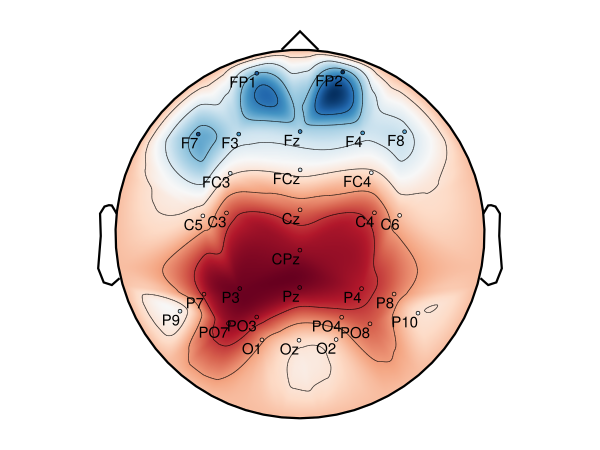

In [788]:
let 

    using CairoMakie
    eeg_topoplot(mean(dat_e[1:30, 100, :], dims=2)[:,1], # averaging all trial of 30 participants on 100th msec
        raw.ch_names[1:30]; 
        positions=pos, # produced  automatically from ch_names
        label_text=true,
        axis=(aspect=DataAspect(),))
    hidedecorations!(current_axis())
    hidespines!(current_axis())
    current_figure()
    f = current_figure()
    #save("plots/plot3.svg", f)
end


- TopoPlot library should be updated soon

# 4. Topographic map

In [732]:
let
    # waiting 
    TopoPlots.eeg_topoplot_series(mean(dat_e[1:30, :, :],dims=3)[:,:,1],50; positions=pos,label_text=true,axis=(aspect=DataAspect(),))

end


# 5. Topoplot array

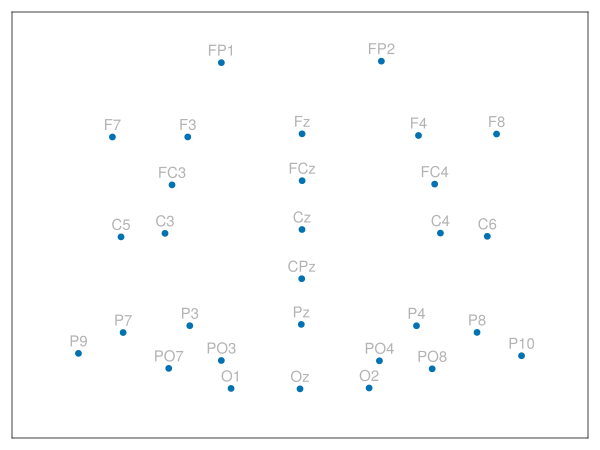

In [492]:
# layout observation
let
    f = Figure()
    ax = Axis(f[1, 1], #yreversed = true,
    xautolimitmargin = (0.15, 0.15),
    yautolimitmargin = (0.15, 0.15)
    )
    hidedecorations!(ax)
    CairoMakie.scatter!(pos)

    text!(pos, text = raw.ch_names[1:30], color = :gray70, offset = (0, 5),
        align = (:center, :bottom))
    f
end

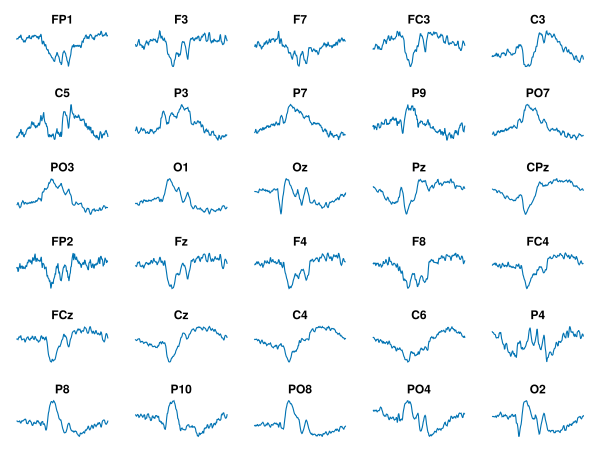

In [360]:
# grid version
let 
    data = @pipe results_onesubject |> 
        @subset(_, :channel .< 31 ) |>
        @subset(_, :coefname .== ("(Intercept)")) |>
        select(_, Not([:basisname, :group, :subject, :coefname])) |>

        groupby(_, :channel) |> 
        transform(_, [:estimate,:time] => (x,t) -> x .- mean(x[t .< 0])) |> # baseline correction using lambda function 
        rename!(_, :estimate_time_function => :estimate_bsln_corrected)


    f = Figure()
    row = 1
    col = 1
    for i in 1:30
        ax = Axis(f[row, col], title = raw.ch_names[i]) # attribte for position 
        col = col + 1
        if i % 5 .== 0
            col = 1 
            row = row + 1 
        end
        hidespines!(ax) 
        hidedecorations!(ax)
        tmp = data[data[:, :channel] .== i, :] 
        lines!(tmp.time, tmp.estimate_bsln_corrected)
    end
    f
    #save("plots/plot5.svg", f)
end

In [525]:
# important functions for the main plot
function del_empt2(coord)
    # searching for unsued coordinates

    tmp = Array(minimum(coord):maximum(coord))
    unused = []
    for i in tmp
        if !(i in coord)
            append!(unused, i)
        end
    end
    
    # creation of new coordinates without unused ones
    newcoord = []
    for i in coord
        q = 0
        for j in unused  
            if i > j
                q = findall(x->x==j, unused)[1]
            end
        end
        append!(newcoord, i - q)
    end 
    newcoord
end

function del_empt(pos)
    x, y = [], []

    for i in pos
        append!(x, i[1])
        append!(y, i[2])
    end
    x = round.(x; digits=2)
    y = Integer.(round.((y .- mean(y))  * 20))
    x = Integer.(round.((x .- mean(x))  * 20))

    newx = del_empt2(x)
    newy = del_empt2(y)

    ma = findall(xx->xx==maximum(newx), newx)[1]
    mi = findall(xx->xx==minimum(newx), newx)[1]
    newx[mi] = newx[mi] + 1
    newx[ma] = newx[ma] - 1
    # return
    newx, newy
end

del_empt (generic function with 2 methods)

In [524]:
x, y = [], []

for i in pos
    append!(x, i[1])
    append!(y, i[2])
end
x = round.(x; digits=2)
x = Integer.(round.((x .- mean(x))  * 20))

ma = findall(xx->xx==maximum(x), x)[1]
mi = findall(xx->xx==minimum(x), x)[1]
x[mi] = x[mi] + 1
x[ma] = x[ma] - 1

6

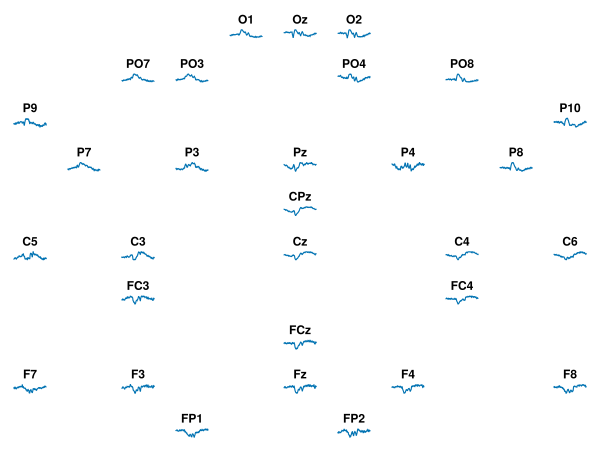

In [526]:
# the main plot
let 
    data = @pipe results_onesubject |> 
        @subset(_, :channel .< 31 ) |>
        @subset(_, :coefname .== ("(Intercept)")) |>
        select(_, Not([:basisname, :group, :subject, :coefname])) |>
        groupby(_, :channel) |> 
        transform(_, [:estimate,:time] => (x,t) -> x .- mean(x[t .< 0])) |> # baseline correction using lambda function 
        rename!(_, :estimate_time_function => :estimate_bsln_corrected)

    f = Figure()

    x = []
    y = []
    x, y = del_empt(pos)

    for i in 1:30
        col = x[i]
        row = y[i]
        ax = Axis(f[row, col], title = raw.ch_names[i]) # attribte for position 
        #println(raw.ch_names[i], " ",  row, " ", col)
        hidespines!(ax) 
        hidedecorations!(ax)
        tmp = data[data[:, :channel] .== i, :] 
        lines!(tmp.time, tmp.estimate_bsln_corrected)
    end
    f
    #save("plots/plot5.svg", f)
end

- reverse y
- P9 and P10 are too far

# 6. ERP image

In [170]:
let
    #f = Figure()
    ix = sortperm([a[1] for a in argmax(dat_e[28,:,:], dims=1)][1,:])   # ix - trials sorted by time of maximum spike
                                                                        # sortperm() computes a permutation of the array's indices that puts the array into sorted order:
    f, ax, hm = CairoMakie.heatmap((dat_e[28,:,ix]), colormap=Reverse("RdBu"), colorrange = (-40, 40))
    ax = current_axis()
    ax.xlabel = "Time [sec]"
    ax.ylabel = "Sorted trials"
    @show hm
    #Colorbar(f[:, end+1], hm)
    CairoMakie.Colorbar(f[:, end+1], hm, label = "Voltage [µV]") 
    hidespines!(ax, :t, :r) 
    f
    #save("plots/plot6.svg", f)
end

hm = Heatmap{Tuple{Vector{Float32}, Vector{Float32}, Matrix{Float32}}}


In [ ]:
ix = sortperm([a[1] for a in argmax(dat_e[28,:,:], dims=1)][1,:])

# 7.Parallel coordinates

In [7]:
findall(raw.ch_names.=="PO8")

show(stdout, raw.ch_names)  
raw.ch_names[[3, 2, 18, 18, 19]]
#tmp = [3, 2, 18, 18, 19]


["FP1", "F3", "F7", "FC3", "C3", "C5", "P3", "P7", "P9", "PO7", "PO3", "O1", "Oz", "Pz", "CPz", "FP2", "Fz", "F4", "F8", "FC4", "FCz", "Cz", "C4", "C6", "P4", "P8", "P10", "PO8", "PO4", "O2", "HEOG_left", "HEOG_right", "VEOG_lower"]

5-element Vector{String}:
 "F7"
 "F3"
 "F4"
 "F4"
 "F8"

## version 1

Point{2, Float32}[[100.0, 337.44427], [250.0, 315.3655], [400.0, 258.71704], [550.0, 131.90321], [700.0, 136.05568]]	
Point{2, Float32}[[100.0, 180.00511], [250.0, 312.05667], [400.0, 181.72392], [550.0, 197.3978], [700.0, 411.9218]]	
Point{2, Float32}[[100.0, 394.2059], [250.0, 352.1601], [400.0, 317.6749], [550.0, 122.33849], [700.0, 371.76215]]	
Point{2, Float32}[[100.0, 213.97783], [250.0, 224.17401], [400.0, 361.95], [550.0, 383.35944], [700.0, 497.9521]]	
Point{2, Float32}[[100.0, 500.0], [250.0, 391.09494], [400.0, 147.5249], [550.0, 288.25003], [700.0, 292.07074]]	


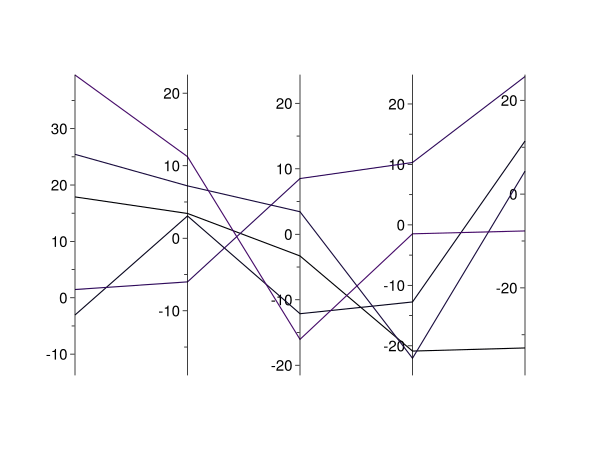

In [46]:
# example
using CairoMakie

let
    s = Scene(camera = campixel!)

    n = 5
    k = 20

    data = [randn(k) .* (rand() + 1) * 10 for _ in 1:n]


    limits = extrema.(data)

    scaled = [(d .- mi) ./ (ma - mi) for (d, (mi, ma)) in zip(data, limits)]

    width = 600
    height = 400
    offset = 100

    for i in 1:n
        x = (i - 1) / (n - 1) * width
        MakieLayout.LineAxis(s, limits = limits[i],
            spinecolor = :black, labelfont = "Arial",
            ticklabelfont = "Arial", spinevisible = true,
            minorticks = IntervalsBetween(2),
            endpoints = Point2f[(offset + x, offset), (offset + x, offset + height)],
            ticklabelalign = (:right, :center), labelvisible = false)
    end

    for i in 1:5
        #println(data)
        values = map(1:5, data, limits) do j, d, l
            x = (j - 1) / (n - 1) * width
            Point2f(offset + x, (d[i] - l[1]) ./ (l[2] - l[1]) * height + offset)
            
        end
        println(values, "\t")
        lines!(s, values, color = get(Makie.ColorSchemes.inferno, (i - 1) / (k - 1)))
    end

    s

end

In [43]:
let
    tmp = [3, 2, 17, 18, 19]
    res = effects(Dict(:category=>["face","car"], :condition=>["intact"]), mres)
    data = @pipe res |> 
        filter(x -> x.channel in tmp, _) |>
        select(_, Not([:basisname, :condition]))

    limits = extrema.(data).yhat # for each electrode
end

1930-element Vector{Tuple{Float64, Float64}}:
 (0.06261653971779801, 0.06261653971779801)
 (-0.9768574769241964, -0.9768574769241964)
 (-1.118531231285663, -1.118531231285663)
 (0.10298862411709714, 0.10298862411709714)
 (1.1457198623675209, 1.1457198623675209)
 (-1.0115257412609737, -1.0115257412609737)
 (-1.703895732291779, -1.703895732291779)
 (-2.0981428989111213, -2.0981428989111213)
 (-0.4764385941173165, -0.4764385941173165)
 (0.9867507869401442, 0.9867507869401442)
 ⋮
 (4.259446207967672, 4.259446207967672)
 (1.7800277436772536, 1.7800277436772536)
 (0.24591464444417088, 0.24591464444417088)
 (-0.5392141723997778, -0.5392141723997778)
 (2.777125723370126, 2.777125723370126)
 (3.3274537849459884, 3.3274537849459884)
 (2.2251978272918027, 2.2251978272918027)
 (1.5982994772583066, 1.5982994772583066)
 (1.0348232171641931, 1.0348232171641931)

In [303]:
let
    x = 0:100:500
    @show Array(x)
end

Array(x) = [0, 100, 200, 300, 400, 500]


6-element Vector{Int64}:
   0
 100
 200
 300
 400
 500

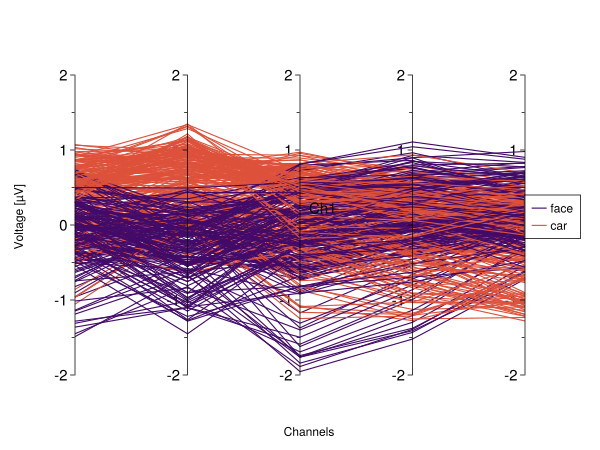

In [338]:
# plot itself

let
    channels = [2, 3, 17, 18, 19]
    res = effects(Dict(:category=>["face", "car"], :condition=>["intact"]), mres)
    data = @pipe res |> 
        filter(x -> x.channel in channels, _) |>
        select(_, Not([:basisname, :condition])) 
    cat = ["face", "car"]
    timestamps = unique(data.time)
    n = length(channels) # number of axis
    k = 20

    # axes
    f = Figure()
    width = 600;    height = 400
    offset = 100;   center = 300
    for i in 1:n
        x = (i - 1) / (n - 1) * width
        Makie.LineAxis(f.scene,  limits = (-2, 2), # maybe consider as unique axis????
            spinecolor = :black, labelfont = "Arial", 
            ticklabelfont = "Arial", spinevisible = true,
            minorticks = IntervalsBetween(2),  
            endpoints = Point2f[(offset + x, offset), (offset + x, offset + height)],
            ticklabelalign = (:right, :center), labelvisible = false)
    end

    # lines
   # lins = Any[]
    for j in timestamps 
        tmp1 = filter(x -> (x.time == j),  data) #1 timepoint, 10 rows (2 conditions, 5 channels) 
        for i in cat
            tmp2 = filter(x -> (x.category == i),  tmp1)
            values = map(1:n, tmp2.yhat) do j, d # axes, data
                x = (j - 1) / (n - 1) * width
                Point2f(offset + x, d * 25 + center) 
                    end
            #println(i, " ",  j, " ", values)
           
            if i .== "face"
                lines!(f.scene, values; color = cgrad(:inferno, 6, categorical = true)[2])
            else  
                lines!(f.scene, values; color = cgrad(:inferno, 6, categorical = true)[4])
            end 
       
            #push!(lins, l)

        end
    end 

     # extremly bad realisation of legend
    ax = f[1, 1] = Axis(f.scene)
    lines!(ax, 1, 1, 1, label = "face", color = cgrad(:inferno, 6, categorical = true)[2])
    lines!(ax, 1, 1, 1, label = "car", color = cgrad(:inferno, 6, categorical = true)[4])
    axislegend(ax, position = :rc)

    hidespines!(ax) 
    hidedecorations!(ax, label = false) 

    ax.xlabel = "Channels"
    ax.ylabel = "Voltage [µV]"
    x = Array(0:100:400)
    y = [10, 100, 100, 100, 100]
    ch = ["Ch2", "Ch3", "Ch17", "Ch18", "Ch19"]

    ax = Axis(f[1, 1])
   #=  text!(x, y, text = ch, align = (:center, :center), 
        offset = (0, 0), #markerspace = :data, 
        color = :black) =#
    text!(Point.(-19, 10), text= "Ch1")


    hidespines!(ax) 
    hidedecorations!(ax, label = false) 
    #= ax = current_axis(current_figure())
    =#
   #=  x = repeat(1:3, 4)
    y = repeat(1:4, inner = 3)
    aligns = [(h, v) for v in [:bottom, :baseline, :center, :top]    for h in [:left, :center, :right]]
    text!(1, 1, text = string.(aligns), align = aligns)
 =#
    f 


end

- a gap between plot and legend
- channel names
- limits should not be hardcoded

## version 2

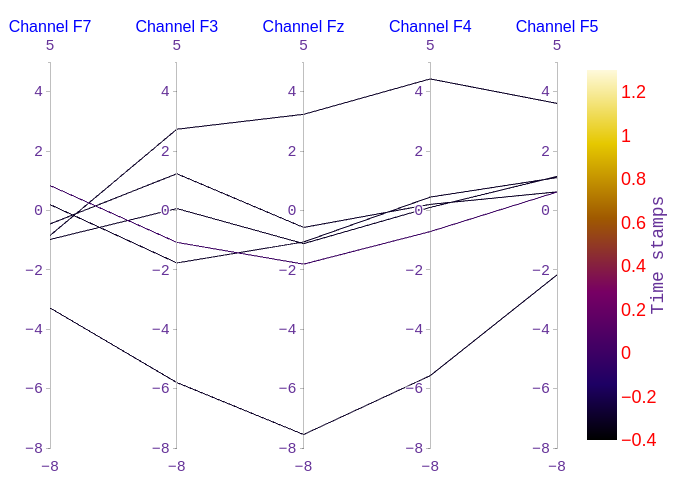

In [770]:
let
    using PlotlyJS, DataFrames

    row = [3, 2, 17, 18, 19]
    timerow = [-0.3, 0.0046875, 0.3015625, 0.60625, 0.903125, 1.2]
    res = effects(Dict(:category=>["face"], :condition=>["intact"]), mres)
    df = @pipe res |> 
        filter(x -> x.channel in row, _) |>
        filter(x -> x.time in timerow, _) |>
        @transform(_, :time = string.(:time)) |>
        select(_, Not([:basisname, :condition])) 
   #show(stdout, unique(df.time))
   #show(stdout, df)
   #df
   

    f = parcoords(; 
        line = attr(color = df.time,  colorscale = "Electric", 
                 colorbar = attr(xpad = 20, title = (text = "Time stamps", size = 12, side = "right"), tickfont = (color = :red, family = "Arial")),
                showscale = true, 
                cmin = -0.4, outlinewidth = 12,
                cmax = 1.3 ),  
        dimensions = [
            attr(range = [-8,5], 
                label = "Channel F7", values = filter(tmp -> (tmp.channel == 3),  df).yhat),
            attr(range = [-8,5],
                label = "Channel F3", values = filter(tmp -> (tmp.channel == 2),  df).yhat),
            attr(range = [-8,5],
                label = "Channel Fz", values = filter(tmp -> (tmp.channel == 17),  df).yhat),
            attr(range = [-8,5],
                label = "Channel F4", values = filter(tmp -> (tmp.channel == 18),  df).yhat),
            attr(range = [-8,5],
                label = "Channel F5", values = filter(tmp -> (tmp.channel == 19),  df).yhat)
            ], 
            labelfont = (color = :blue, size = 16, family = "Arial")            
            ); 

    myplot = PlotlyJS.plot(f, 
    Layout(       
        #xaxis_title="X Axis Title",
        yaxis=attr(title = (text = "Y Axis Title")),
        #legend_title="Legend Title",
        font=attr(
            family="Courier New, monospace",
            size=18,
            color="RebeccaPurple"
        )
    ))
    myplot
    #unique(df.time)
    #save("plots/plot7.svg", myplot)

end

In [ ]:
-0.3
  0.0046875
  0.3015625
  0.60625
  0.903125
  1.2

In [498]:
df = DataFrame(group=repeat([1,2,3], inner=10), response1 = rand(30), response2 = rand(30), response3=rand(30), response4=rand(30));
df

,group,response1,response2,response3,response4
,Int64,Float64,Float64,Float64,Float64
1,1,0.760905,0.2658,0.60556,0.962429
2,1,0.701615,0.220608,0.618651,0.60187
3,1,0.328838,0.268232,0.67253,0.969307
4,1,0.725894,0.252833,0.657002,0.263654
5,1,0.494555,0.971156,0.244792,0.0609204
6,1,0.0904916,0.534448,0.687834,0.232004
7,1,0.66225,0.248522,0.47709,0.147361
8,1,0.384745,0.712313,0.421823,0.392838
9,1,0.372343,0.510965,0.817624,0.23232


In [514]:
row = [3, 2, 17, 18, 19]
res = effects(Dict(:category=>["face","car"], :condition=>["intact"]), mres)
data = @pipe res |> 
    filter(x -> x.channel in row, _) |>
    select(_, Not([:basisname, :condition])) 
# get every 5th  value
size(data.time)

(1930,)

# 8. Imageesc

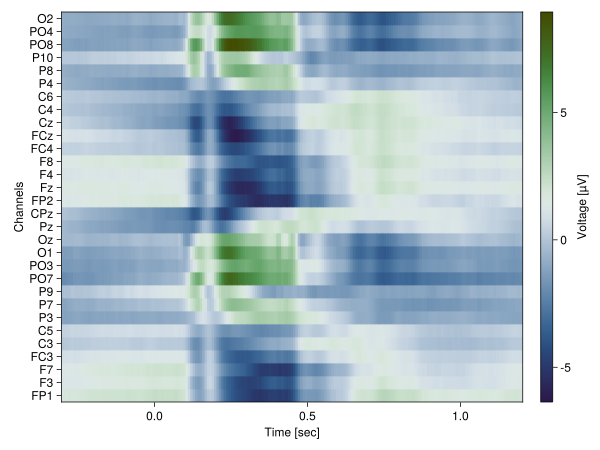

In [182]:
let 
    #f = Figure()
    ix = range(-0.3, 1.2, length = size(dat_e, 2))
    iz = mean(dat_e, dims=3)[1:30, :, 1]'
    f, ax, hm = CairoMakie.heatmap(ix, 1:30, iz, 
       colormap="cork") # single trial
    ax = current_axis()
    ax.xlabel = "Time [sec]"
    ax.ylabel = "Channels"
    ax.yticks = 1:30
    ax.ytickformat = xs -> raw.ch_names[Int.(xs)]
    Colorbar(f[1, 2], hm,  label = "Voltage [µV]") 
    current_figure()
    #save("plots/plot8.svg", f)
end 

- arrangement of channels should be specified

# Data

In [ ]:
let 
    #first(results_onesubject[:, !1], 5)
    #unique(results_onesubject[:, 2])
    data = @pipe results_onesubject |> 
        select(_, Not([:basisname, :group])) |>
        @subset(_, :channel .== 18) |>
        @transform(_, :channel = string.(:channel)) 
    data = filter(x -> x.coefname == "category: face" || x.coefname == "category: scrambled" , 
    data) 

    data
end